In [1]:
import numpy as np
import pandas as pd

import glob, random, os, warnings
import matplotlib.pyplot as plt
from datetime import datetime
from tqdm import tqdm
import seaborn as sns
from time import time
import time as t
import shutil
import cv2

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay


import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.layers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#To get the same results in different environments
def seed_everything(seed = 0):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = "True"
    os.environ["TF_DISABLE_SEGMENT_REDUCTION_OP_DETERMINISM_EXCEPTIONS"] = "True"

seed_everything()
warnings.filterwarnings('ignore')


print('TensorFlow Version ' + tf.__version__)

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

TensorFlow Version 2.12.0


In [2]:
image_size = 224
batch_size = 32
n_classes = 2
learning_rate = 0.001
weight_decay = 0.0001
num_epochs = 50

mlp_rate = 2
patch_size = 16  # Size of the patches to be used while extracting them from images
num_patches = (image_size // patch_size) ** 2
projection_dim = 64
num_heads = 4
transformer_units = [
    projection_dim * 2,
    projection_dim,
]  # Size of the transformer layers
transformer_layers = 8

In [5]:
class_to_label_map = {'COVID' : 1, 'non-COVID' : 0}

In [6]:
df = pd.DataFrame(columns =['class', 'directory'])  
for path, names, filenames in os.walk('/kaggle/input/sarscov2-ctscan-dataset/non-COVID'):
    for filename in filenames:
        df.loc[-1] = ["Non-COVID", ('non-COVID/' + filename)] 
        df.index = df.index + 1 
        df = df.sort_index() 
for path, names, filenames in os.walk('/kaggle/input/sarscov2-ctscan-dataset/COVID'):
    for filename in filenames:
        df.loc[-1] = ["COVID", ('COVID/' + filename)] 
        df.index = df.index + 1 
        df = df.sort_index() 

In [7]:
df

,class,directory
0,COVID,COVID/Covid (598).png
1,COVID,COVID/Covid (256).png
2,COVID,COVID/Covid (94).png
3,COVID,COVID/Covid (1031).png
4,COVID,COVID/Covid (176).png
...,...,...
2476,Non-COVID,non-COVID/Non-Covid (501).png
2477,Non-COVID,non-COVID/Non-Covid (672).png
2478,Non-COVID,non-COVID/Non-Covid (179).png
2479,Non-COVID,non-COVID/Non-Covid (352).png


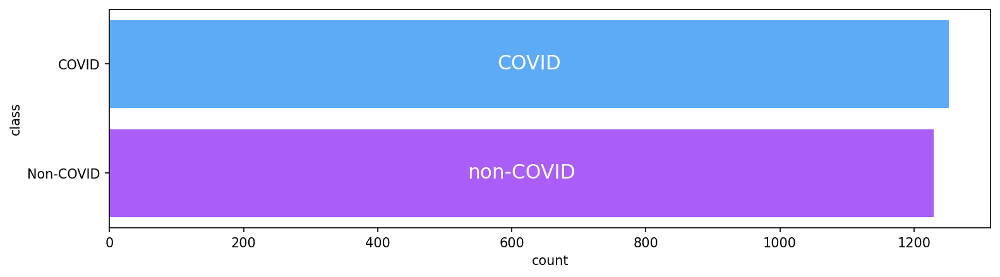

In [8]:
plt.rcParams['figure.dpi'] = 150
plt.style.use('tableau-colorblind10')

plt.figure(figsize=(12,3))
splot = sns.countplot(data = df.sort_values(by='class'), y ='class', palette='cool', saturation=0.9)
plt.bar_label(container=splot.containers[0], 
              labels=['COVID', 'non-COVID'], 
              label_type='center', size=15, color='w')

plt.show()

<Axes: ylabel='count'>

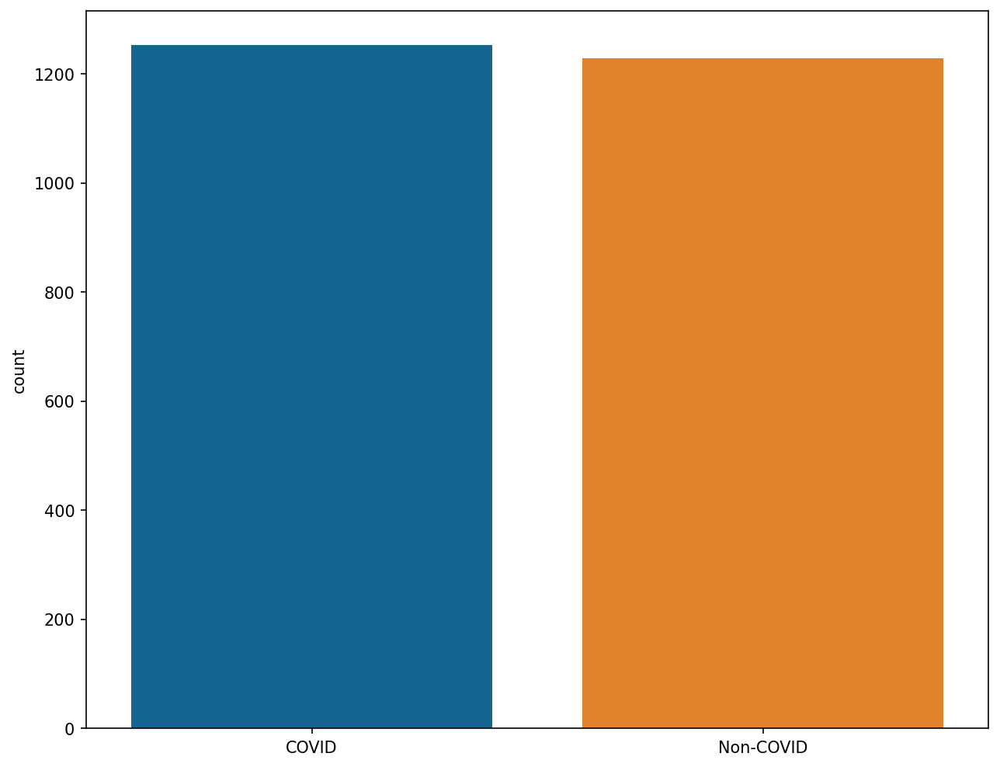

In [9]:
labels = df['class'].values
plt.figure(figsize = (10,8))
sns.countplot(x =labels)

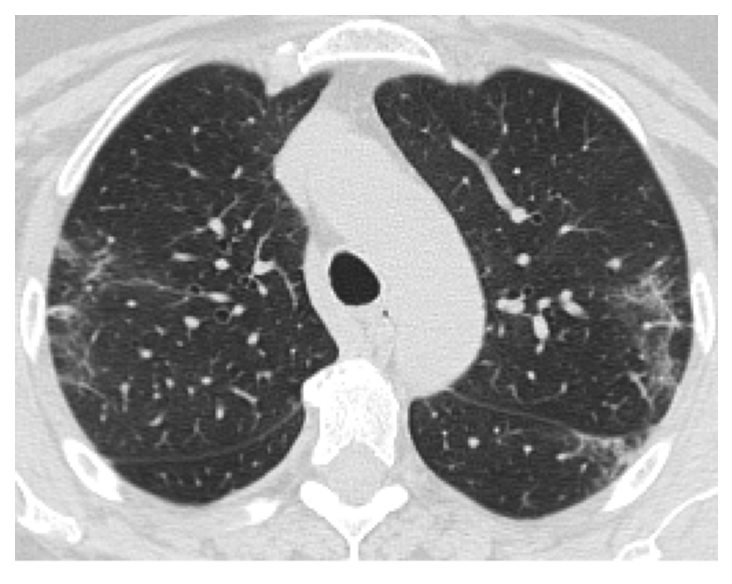

Image Shape: (202, 256, 3)
Image Height: 202
Image Width: 256
Image Dimension: 3
Image Size: 151kb
Image Data Type: uint8
Maximum RGB value of the image: 255
Minimum RGB value of the image: 36


In [10]:
plt.figure()
image = cv2.imread("/kaggle/input/sarscov2-ctscan-dataset/COVID/Covid (1).png")
plt.imshow(image)
plt.axis('off')
plt.show() 

print('Image Shape: {}'.format(image.shape))
print('Image Height: {}'.format(image.shape[0]))
print('Image Width: {}'.format(image.shape[1]))
print('Image Dimension: {}'.format(image.ndim))
print('Image Size: {}kb'.format(image.size//1024))
print('Image Data Type: {}'.format(image.dtype))
print('Maximum RGB value of the image: {}'.format(image.max()))
print('Minimum RGB value of the image: {}'.format(image.min()))

In [11]:
X_train, X_test, Y_train, Y_test = train_test_split(df['directory'], df['class'], stratify= df['class'], test_size=0.20, random_state=1)

In [12]:
print(f"""
{'-'*40}
# Train samples: {Y_train.shape}
# Test samples: {Y_test.shape}
{'-'*40}
""")


----------------------------------------
# Train samples: (1984,)
# Test samples: (497,)
----------------------------------------



In [13]:
def copy_images(df, directory):
    input_path = "/kaggle/input/sarscov2-ctscan-dataset"
    output_path = "/kaggle/working/out/" + directory 
    
    #if any old file exists in ouput path, it is removed
    if os.path.exists(output_path):
        shutil.rmtree(output_path)
        
    #creating folder inside output path
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    
    #these three subfolders
    classes = ['COVID', 'non-COVID']
    for c in classes:
        if not os.path.exists(output_path + '/' + c):
            os.makedirs(output_path + '/' + c)
    
    #the original dataframe containing directory for each row, those directory are shifted from path_from to path_to
    #(that is from input directory to ouput directory)
    for i, row in df.iterrows():
        path_from = "{}/{}".format(input_path, row['directory'])
        path_to = "{}/{}".format(output_path, row['directory'])
        shutil.copy(path_from, path_to)
        

In [14]:
df_test = pd.concat([X_test, Y_test], axis = 1)
df_train = pd.concat([X_train, Y_train], axis = 1)

copy_images(df_test, 'test')
copy_images(df_train, 'train')

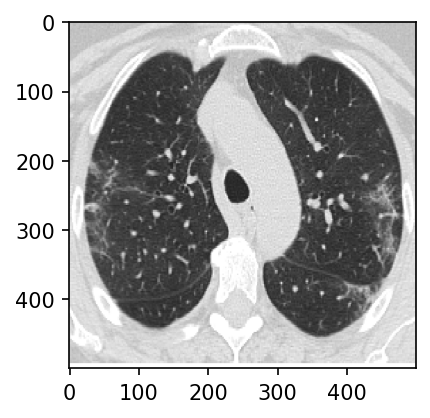

In [15]:
image_path = '/kaggle/input/sarscov2-ctscan-dataset/COVID/Covid (1).png'
img = tf.keras.preprocessing.image.load_img(image_path, target_size= (500,500))
img_tensor = tf.keras.preprocessing.image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
#Allows us to properly visualize our image by rescaling values in array
img_tensor /= 255.
#Plots image
plt.figure(figsize=(3,3))
plt.imshow(img_tensor[0])
plt.show()

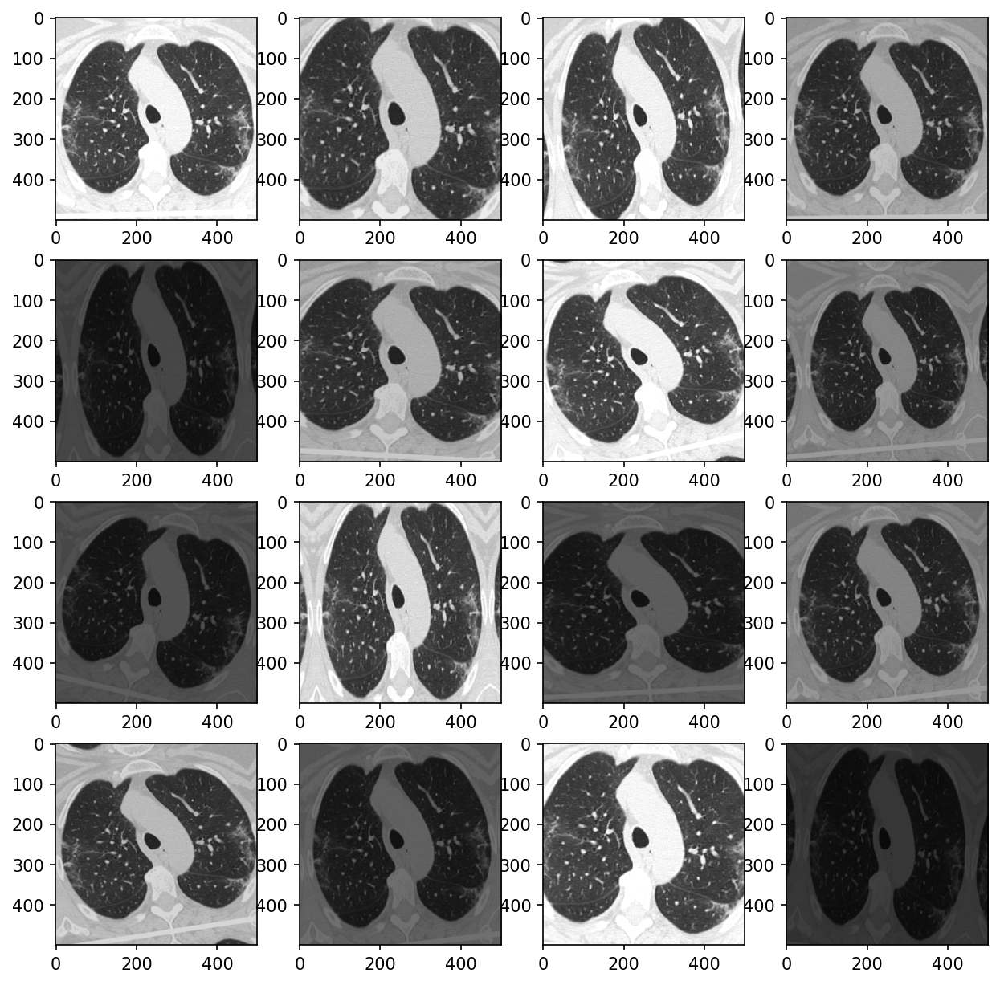

In [16]:
datagen = ImageDataGenerator(featurewise_center = "True",
                            featurewise_std_normalization = "True",
                            shear_range = 0.25,
                            zoom_range = 0.2,
                            rotation_range = 15,
                            brightness_range = [0.15, 1.15],
                            width_shift_range = [-2,-1, 0, +1, +2],
                            height_shift_range = [ -1, 0, +1],
                            fill_mode = 'reflect')
#Creates our batch of one image
pic = datagen.flow(img_tensor*255, batch_size =1)
plt.figure(figsize=(10, 10))
#Plots our figures
for i in range(1,17):
    plt.subplot(4, 4, i)
    batch = pic.next()
    image_ = batch[0].astype('uint8')
    plt.imshow(image_)
plt.show()


In [18]:
test_path = '/kaggle/working/out/test'
train_path = '/kaggle/working/out/train'

#Data augmentation methods are applied here!
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,
                                                            validation_split = 0.2,
                                                            featurewise_center = "True",
                                                            featurewise_std_normalization = "True",
                                                            shear_range = 0.25,
                                                            zoom_range = 0.2,
                                                            rotation_range = 15,
                                                            brightness_range = [0.15, 1.15],
                                                            width_shift_range = [-2,-1, 0, +1, +2],
                                                            height_shift_range = [ -1, 0, +1],
                                                            fill_mode = 'reflect')

#Different generator
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train_gen = datagen.flow_from_dataframe(dataframe = df_train,
                                        directory = train_path,
                                        x_col = 'directory',
                                        y_col = 'class',
                                        subset = 'training',
                                        batch_size = batch_size,
                                        seed = 1,
                                        color_mode = 'grayscale',
                                        shuffle = True,
                                        class_mode = 'categorical',
                                        target_size = (image_size, image_size))

valid_gen = datagen.flow_from_dataframe(dataframe = df_train,
                                        directory = train_path,
                                        x_col = 'directory',
                                        y_col = 'class',
                                        subset = 'validation',
                                        batch_size = batch_size,
                                        seed = 1,
                                        color_mode = 'grayscale',
                                        shuffle = True,
                                        class_mode = 'categorical',
                                        target_size = (image_size, image_size))


test_gen = test_datagen.flow_from_directory(
    directory=test_path,
    color_mode="grayscale",
    batch_size=1,
    class_mode=None,
    shuffle=False,
    seed=1,
    target_size = (image_size, image_size)
)

Found 1588 validated image filenames belonging to 2 classes.
Found 396 validated image filenames belonging to 2 classes.
Found 497 images belonging to 2 classes.


Model-1 Vision Transformer 

In [17]:
class PatchEmbedding(tf.keras.layers.Layer):
    def __init__(self , size , num_of_patches , projection_dim):
        super().__init__()

        self.size=size
        self.num_of_patches= num_of_patches + 1
        self.projection_dim=projection_dim

        self.projection=tf.keras.layers.Dense(projection_dim)

        self.clsToken= tf.Variable(tf.keras.initializers.GlorotNormal()(shape=(1 , 1 , projection_dim)) , trainable=True)
        #create vector for each patch 
        self.positionalEmbedding = tf.keras.layers.Embedding(self.num_of_patches , projection_dim)


    def call(self, inputs):
        patches = tf.image.extract_patches(inputs , sizes=[1 , self.size , self.size , 1], strides=[1 , self.size , self.size , 1], rates=[1 ,1 ,1 ,1], padding="VALID",)
        patches=tf.reshape(patches, (tf.shape(inputs)[0], -1, self.size * self.size *1))
        patches= self.projection(patches)

        # repeat cls token length of batch size
        clsToken = tf.repeat(self.clsToken , tf.shape(inputs)[0] , 0)
        patches = tf.concat((clsToken, patches) , axis=1)
        # create position number for each patch
        positions = tf.range(0 , self.num_of_patches , 1)[tf.newaxis , ...]
        positionalEmbedding = self.positionalEmbedding(positions)

        #print(positionalEmbedding)
        patches= patches + positionalEmbedding
        return patches

Image size: 224 X 224
Patch size: 50 X 50
Patches per image: 20
Elements per patch: 7500


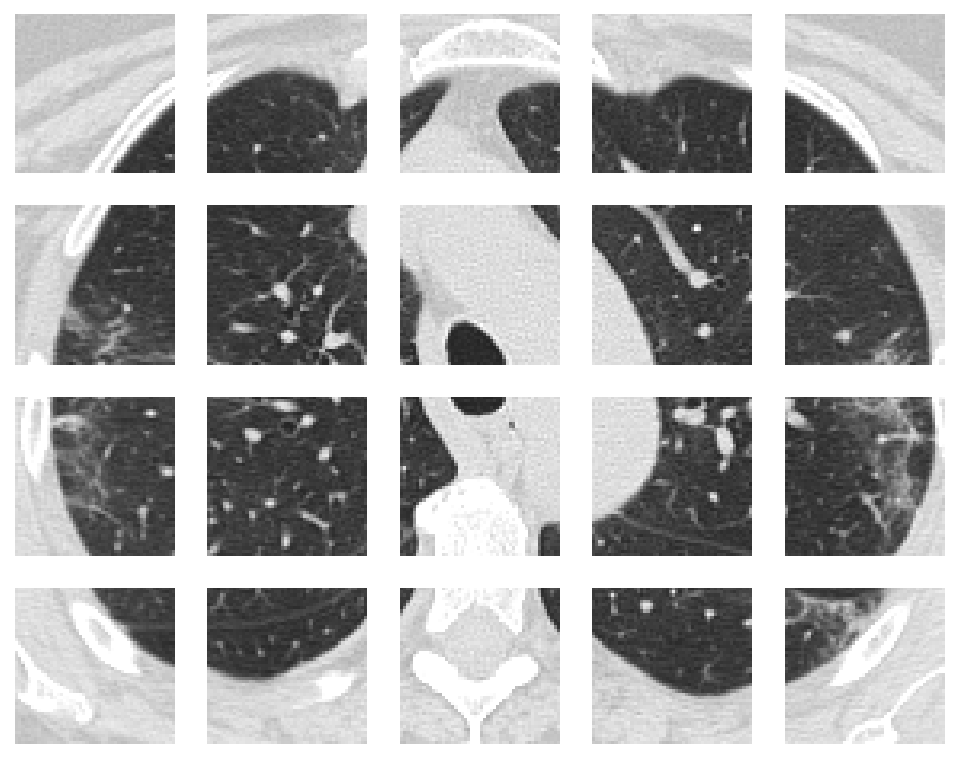

In [18]:
def patch_plot(input_path):

    patch_size = 50
    image_path = input_path
    imgage = tf.keras.preprocessing.image.load_img(image_path)
    imageArray=tf.keras.preprocessing.image.img_to_array(image)
    imageArray = imageArray[tf.newaxis , ...]
    patches= tf.image.extract_patches(imageArray, sizes=[1 , patch_size , patch_size ,1], strides=[1 , patch_size ,patch_size , 1] , rates=[1,1,1,1], padding="VALID" )
    patches=tf.reshape(patches , shape=(tf.shape(patches)[0] , -1 , patch_size*patch_size*3))


    resized_image = tf.image.resize(
        tf.convert_to_tensor([image]), size=(image_size, image_size)
    )

    print(f"Image size: {image_size} X {image_size}")
    print(f"Patch size: {patch_size} X {patch_size}")
    print(f"Patches per image: {patches.shape[1]}")
    print(f"Elements per patch: {patches.shape[-1]}")

    n = int(np.ceil(np.sqrt(patches.shape[1])))
    plt.figure(figsize=(8, 8))
    for i, patch in enumerate(patches[0]):
        ax = plt.subplot(n, n, i + 1)
        patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
        plt.imshow(patch_img.numpy().astype("uint8"))
        plt.axis("off")
    #plt.savefig('patches.png', dpi=1200)
patch_plot('/kaggle/input/sarscov2-ctscan-dataset/COVID/Covid (1).png')

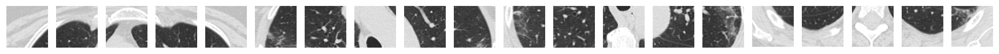

In [19]:
patch_size_2 = 50
image_path = '/kaggle/input/sarscov2-ctscan-dataset/COVID/Covid (1).png'
imgage = tf.keras.preprocessing.image.load_img(image_path)
imageArray=tf.keras.preprocessing.image.img_to_array(image)
imageArray = imageArray[tf.newaxis , ...]
patches= tf.image.extract_patches(imageArray, sizes=[1 , patch_size_2 , patch_size_2 ,1], strides=[1 , patch_size_2 ,patch_size_2 , 1] , rates=[1,1,1,1], padding="VALID" )
patches=tf.reshape(patches , shape=(tf.shape(patches)[0] , -1 , patch_size_2*patch_size_2*3))


n = int(np.ceil(np.sqrt(patches.shape[1])))
plt.figure(figsize=(n *n , 1))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(1 ,n*n , i + 1)
    patch_img = tf.reshape(patch, (50, 50, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")

In [20]:
class TransformerLayer(tf.keras.layers.Layer):
    def __init__(self , d_model , heads , mlp_rate , dropout_rate=0.1):
        super().__init__()

        self.layernorm_1 = LayerNormalization(epsilon=1e-6)
        self.mha= tf.keras.layers.MultiHeadAttention(heads, d_model//heads , dropout=dropout_rate)

        self.layernorm_2 = LayerNormalization(epsilon=1e-6)
        self.mlp = tf.keras.Sequential([
                                        Dense(d_model * mlp_rate , activation="gelu"),
                                        Dropout(dropout_rate),
                                        Dense(d_model , activation="gelu"),
                                        Dropout(dropout_rate)
        ])
    def call(self , inputs , training=True):
        out_1 = self.layernorm_1(inputs)
        out_1 = self.mha(out_1 , out_1 ,training=training)
        out_1 = inputs + out_1

        out_2= self.layernorm_2(out_1)
        out_2=self.mlp(out_2 , training=training)
        out_2 = out_1 + out_2

        return out_2

In [21]:
class TransformerEncoder(tf.keras.layers.Layer):
    def __init__(self , d_model , heads , mlp_rate , num_layers=1 , dropout_rate=0.1):
        super().__init__()

        self.encoders = [TransformerLayer(d_model , heads , mlp_rate , dropout_rate) for _ in range(num_layers)]

    def call(self , inputs , training=True):
        x =inputs

        for layer in self.encoders:
            x = layer(x , training=training)

        return x

In [22]:
class VisionTransformer(tf.keras.Model):
    def __init__(self , num_classes , patch_size , num_of_patches , d_model , heads , num_layers , mlp_rate , dropout_rate=0.1):
        super().__init__()

        self.patchEmbedding = PatchEmbedding(patch_size , num_of_patches , d_model)
        self.encoder = TransformerEncoder(d_model , heads , mlp_rate  ,num_layers , dropout_rate)

        self.prediction = tf.keras.Sequential([
                                               tf.keras.layers.Dropout(0.3),
                                               tf.keras.layers.Dense(mlp_rate * d_model , activation="gelu"),
                                               tf.keras.layers.Dropout(0.2),       
                                               tf.keras.layers.Dense(num_classes, activation="softmax")


      ])
    def call(self , inputs ,  training=True):
        patches = self.patchEmbedding(inputs)
        encoderResult = self.encoder(patches, training=training)

        clsResult = encoderResult[: , 0 , :]

        prediction = self.prediction(clsResult,
                                     training=training)
        return prediction

In [23]:
optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)

model = VisionTransformer(n_classes,
                          patch_size,
                          num_patches,
                          projection_dim,
                          num_heads,
                          transformer_layers,
                          mlp_rate,
                          dropout_rate=0.1)
    
model.compile(optimizer = optimizer, 
              loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing = 0.1), 
              metrics = [tf.keras.metrics.CategoricalAccuracy(name="accuracy"),
                         tf.keras.metrics.TopKCategoricalAccuracy(5, name="top-5-accuracy"),
                        ],
             )


STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

earlystopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                                 min_delta = 0,
                                                 patience = 15,
                                                 mode = 'auto',
                                                 verbose = 1)

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath = './model_ViT.hdf5',
                                                  monitor = 'val_accuracy', 
                                                  verbose = 1, 
                                                  save_best_only = True,
                                                  save_weights_only = True,
                                                  mode = 'max')

decay_steps = train_gen.n // train_gen.batch_size
initial_learning_rate = learning_rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate, decay_steps)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lr_decayed_fn)

callbacks = [earlystopping, lr_scheduler, checkpointer]

startTrain_ViT = time()
history = model.fit(x = train_gen,
          steps_per_epoch = STEP_SIZE_TRAIN,
          validation_data = valid_gen,
          validation_steps = STEP_SIZE_VALID,
          epochs = num_epochs,
          callbacks = callbacks)
time_passed_ViT = time()-startTrain_ViT

Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.8525 - accuracy: 0.5032 - top-5-accuracy: 1.0000
Epoch 1: val_accuracy improved from -inf to 0.54427, saving model to ./model_ViT.hdf5
49/49 [==============================] - 49s 394ms/step - loss: 0.8525 - accuracy: 0.5032 - top-5-accuracy: 1.0000 - val_loss: 0.7017 - val_accuracy: 0.5443 - val_top-5-accuracy: 1.0000 - lr: 0.0010
Epoch 2/50
49/49 [==============================] - ETA: 0s - loss: 0.7786 - accuracy: 0.4974 - top-5-accuracy: 1.0000
Epoch 2: val_accuracy did not improve from 0.54427
49/49 [==============================] - 17s 353ms/step - loss: 0.7786 - accuracy: 0.4974 - top-5-accuracy: 1.0000 - val_loss: 0.7065 - val_accuracy: 0.4870 - val_top-5-accuracy: 1.0000 - lr: 9.9897e-04
Epoch 3/50
49/49 [==============================] - ETA: 0s - loss: 0.7268 - accuracy: 0.4994 - top-5-accuracy: 1.0000
Epoch 3: val_accuracy did not improve from 0.54427
49/49 [==============================] - 17s 347ms/st

In [24]:
model.summary()

Model: "vision_transformer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 patch_embedding (PatchEmbed  multiple                 29120     
 ding)                                                           
                                                                 
 transformer_encoder (Transf  multiple                 267776    
 ormerEncoder)                                                   
                                                                 
 sequential_8 (Sequential)   (None, 2)                 8578      
                                                                 
Total params: 305,474
Trainable params: 305,474
Non-trainable params: 0
_________________________________________________________________


In [25]:
print("Trainable parameters: ",model.count_params() )

print("Running time: ",t.strftime("%Hh%Mm%Ss", t.gmtime(time_passed_ViT)))

Trainable parameters:  305474
Running time:  00h16m29s


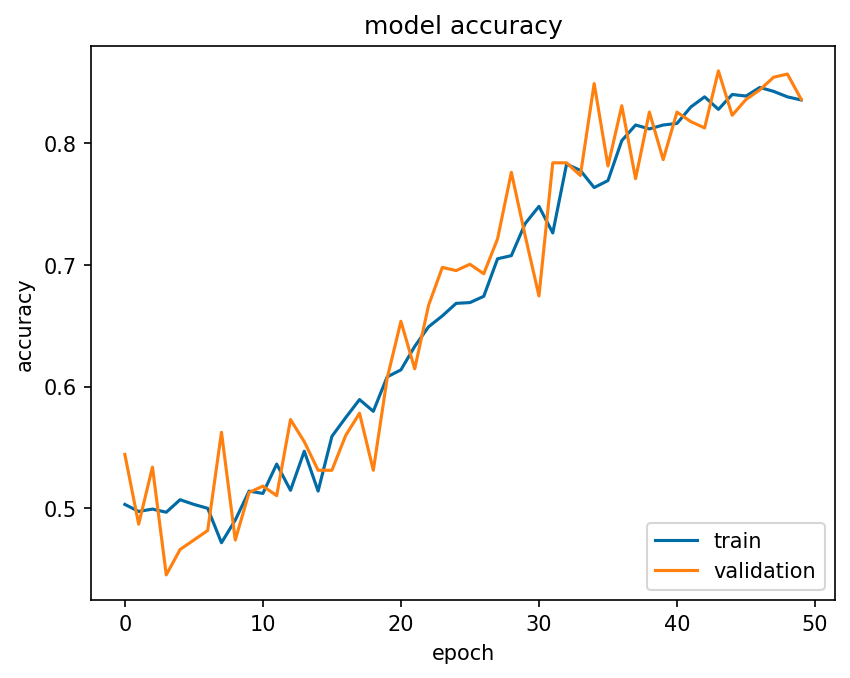

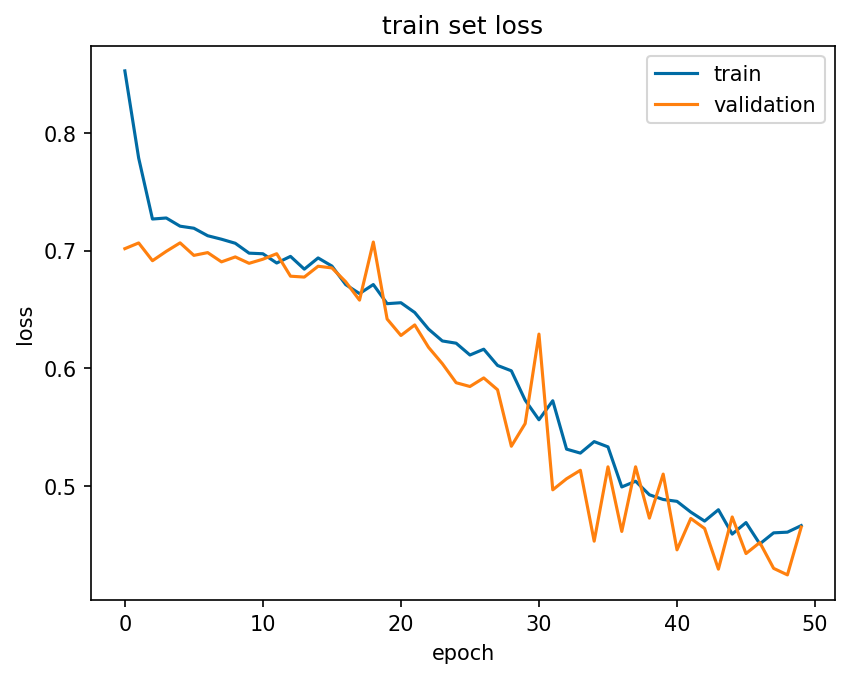

In [26]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('train set loss')

plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [27]:
test_gen.reset()
predY=model.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)
testY = test_gen.classes

497/497 [==============================] - 9s 15ms/step


**Confusion matrix**

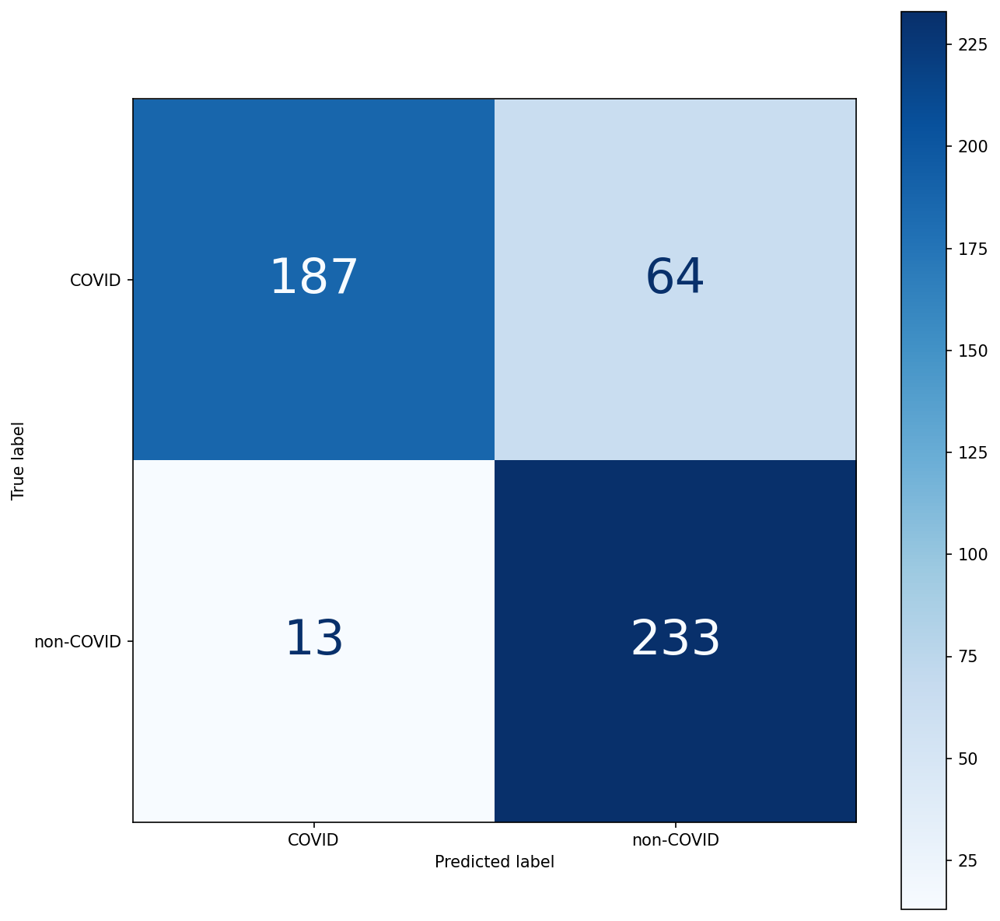

In [28]:
cm = confusion_matrix(testY, np.argmax(predY, axis = -1)) # confusion matrix
cr=(classification_report(testY, np.argmax(predY, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.show()

In [29]:
model.save("ViT_model")
np.save('history_ViT.npy',history.history)

<Axes: >

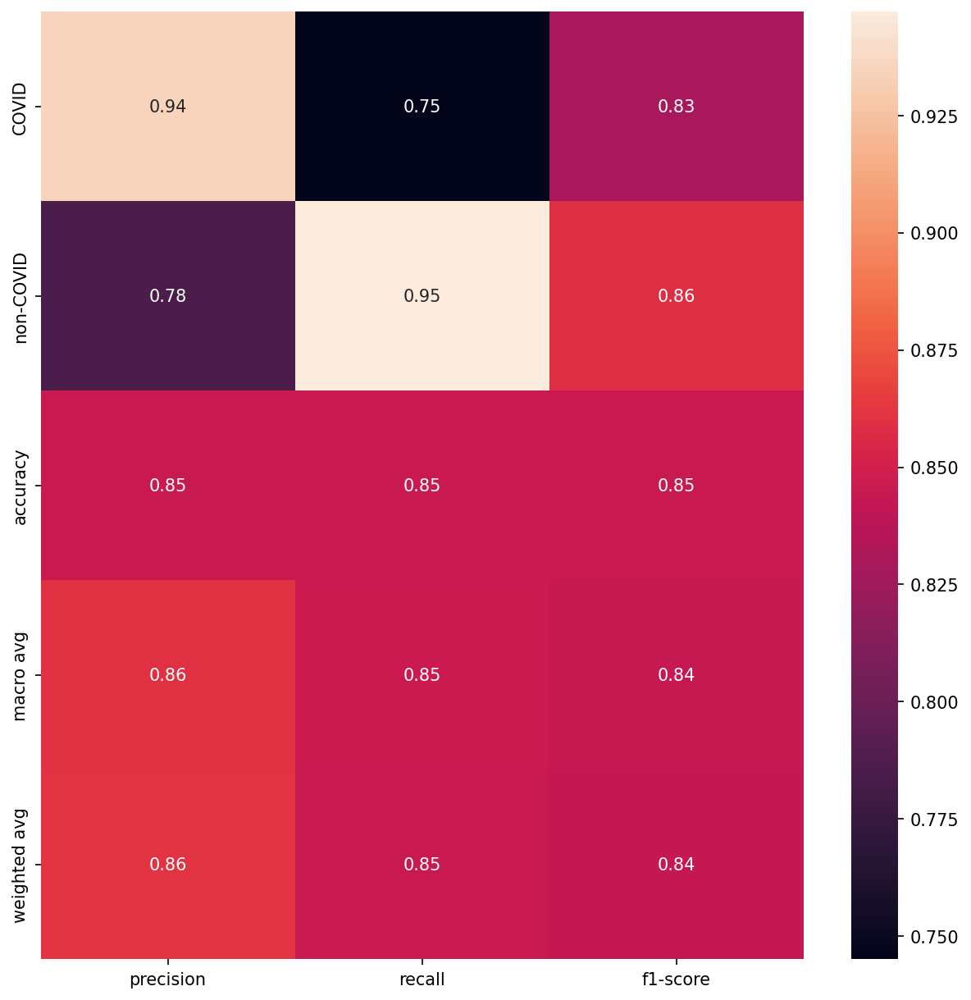

In [30]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.heatmap(pd.DataFrame(cr).iloc[:-1, :].T, annot=True, ax=ax)

In [31]:
y_val = test_gen.classes
y_pred = model.predict(test_gen)
confidence = np.max(y_pred,axis=1)
y_pred = np.argmax(y_pred,axis=1)

497/497 [==============================] - 8s 15ms/step


In [32]:
print(classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.94      0.75      0.83       251
           1       0.78      0.95      0.86       246

    accuracy                           0.85       497
   macro avg       0.86      0.85      0.84       497
weighted avg       0.86      0.85      0.84       497



In [33]:
class_indices = test_gen.class_indices
indices = {v:k for k,v in class_indices.items()}

In [34]:
filenames = test_gen.filenames

In [35]:
result_df = pd.DataFrame()
result_df['filename'] = filenames
result_df['actual'] = y_val
result_df['predicted'] = y_pred
result_df['actual'] = result_df['actual'].apply(lambda x: indices[x])
result_df['predicted'] = result_df['predicted'].apply(lambda x: indices[x])
result_df.loc[result_df['actual']==result_df['predicted'],'Same'] = True
result_df.loc[result_df['actual']!=result_df['predicted'],'Same'] = False
result_df['confidence'] = confidence
result_df.head(10)

,filename,actual,predicted,Same,confidence
0,COVID/Covid (100).png,COVID,non-COVID,False,0.605886
1,COVID/Covid (1010).png,COVID,COVID,True,0.948776
2,COVID/Covid (1013).png,COVID,COVID,True,0.960249
3,COVID/Covid (1024).png,COVID,COVID,True,0.954757
4,COVID/Covid (1035).png,COVID,COVID,True,0.953243
5,COVID/Covid (1042).png,COVID,COVID,True,0.813326
6,COVID/Covid (1043).png,COVID,COVID,True,0.936604
7,COVID/Covid (1052).png,COVID,COVID,True,0.618205
8,COVID/Covid (1055).png,COVID,COVID,True,0.732205
9,COVID/Covid (1059).png,COVID,COVID,True,0.963800


In [36]:
result_df = result_df.sample(frac=1).reset_index(drop=True)

In [37]:
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img
def readImage(path):
    img = load_img(path,color_mode='rgb',target_size=(image_size,image_size))
    img = img_to_array(img)
    img = img/255.
    
    return img

def display_images(temp_df):
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(15):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        image = readImage("/kaggle/input/sarscov2-ctscan-dataset/"+str(temp_df.filename[i]))
        plt.imshow(image)
        plt.title("Actual Class:" + str(temp_df.actual[i]) + "\n" + "Predicted Class:" + str(temp_df.predicted[i]) + "\n" + "Confidence:" + str(temp_df.confidence[i]))

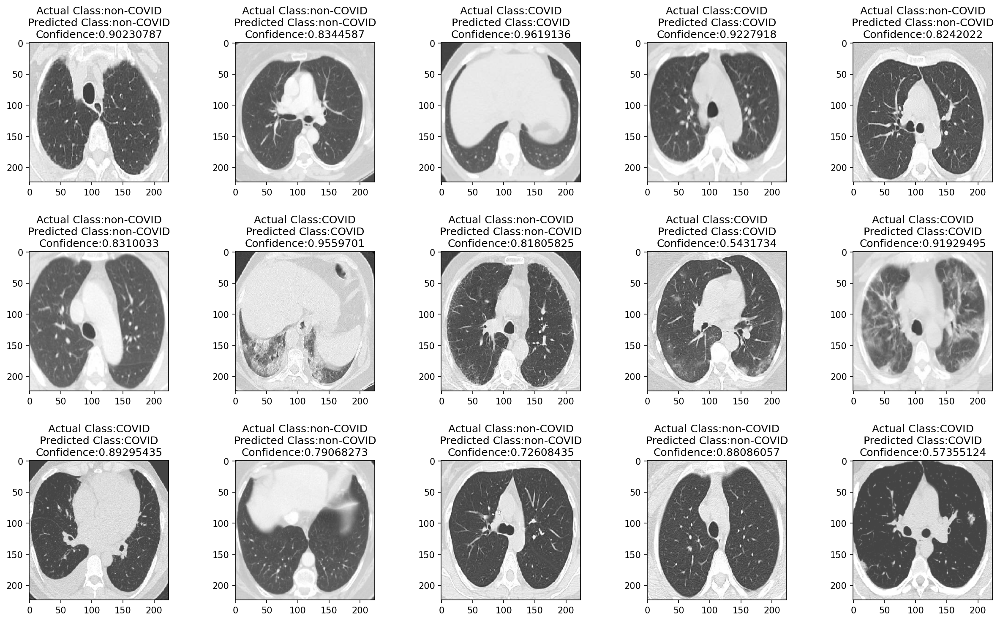

In [38]:
display_images(result_df[result_df['Same']==True])

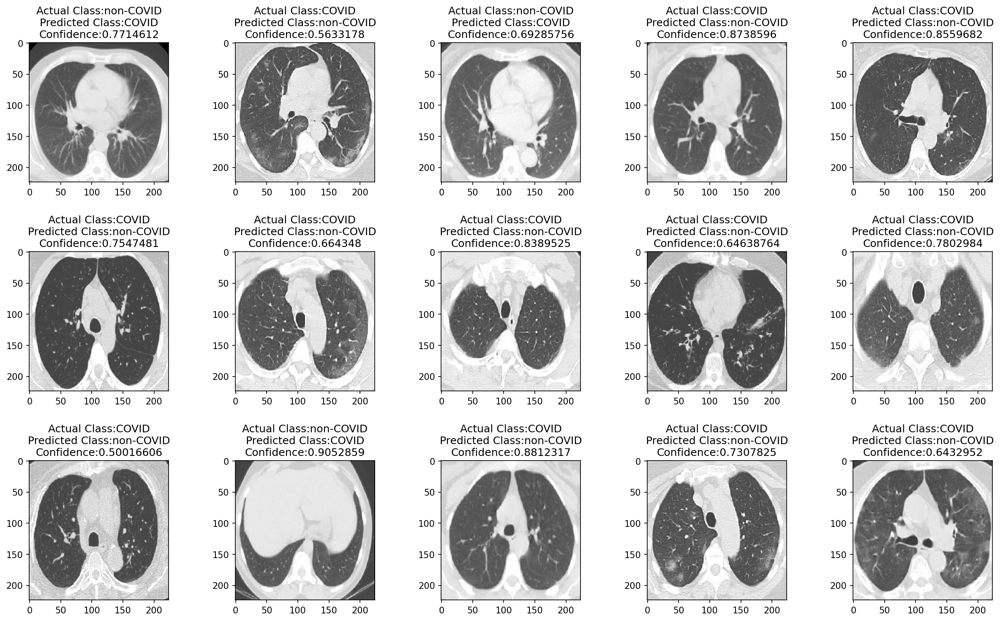

In [39]:
display_images(result_df[result_df['Same']!=True])

**Model 2 -Compact Convoutional Transformer (CCT)**

In [40]:
from tensorflow.keras import layers
from tensorflow import keras
class ConvolutionalTokenizer(layers.Layer):
    """
    Creates Convolutional Tokens of images for feeding to Transformer Encoder.
    """
    def __init__(self,kernel_size=3,stride=1,padding=1,pooling_kernel_size=3,pooling_stride=2,conv_layers=2,num_output_channels=[64, 128],**kwargs,):
        super(ConvolutionalTokenizer, self).__init__(**kwargs)
        
        # Creating a Sequential Keras Model for Tokenizing images
        self.conv_model = keras.Sequential()
        # Created the required number of convolutional layer
        for i in range(conv_layers):
            # Adding a conv2d layer with ReLU activation as suggested by authors
            self.conv_model.add(layers.Conv2D(num_output_channels[i],kernel_size,stride,padding="valid",use_bias=False,activation="relu",kernel_initializer="he_normal"))
            # Zero Padding
            self.conv_model.add(layers.ZeroPadding2D(padding))
            # Pooling over the image with 3x3 kernel having padding='same' and stride=2   
            self.conv_model.add(layers.MaxPool2D(pooling_kernel_size, pooling_stride, "same"))

    def call(self, images):
        # Reshaping the outputs by flattening them
        outputs = self.conv_model(images)
        Flattened = tf.reshape(
            outputs,
            (-1, tf.shape(outputs)[1] * tf.shape(outputs)[2], tf.shape(outputs)[3]),
        )
        return Flattened

    # Adding Learnable Positional Embeddings
    def pos_embeddings(self, image_size):
        inp = tf.ones((1, image_size, image_size, 1))
        out = self.call(inp)
        seq_len = tf.shape(out)[1]
        projection_dim = tf.shape(out)[-1]

        embed_layer = layers.Embedding(
            input_dim=seq_len, output_dim=projection_dim
        )
        return embed_layer, seq_len

In [41]:
def mlp(x, hidden_units, dropout):
    """
    Creates A Feed Forward Network`
    
    Args:
        hidden_units: Number of hidden units in MLP
        dropout: The Rate of dropout which is to be applied.
    """
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout)(x)
    return x

In [42]:
def Transformer_Encoder(L,embedded_patches,num_heads,projection_dim,transformer_units):
    """
    Transformer Encoder Block
    
    Args: 
        L: number of transformer_layers
        
        embedded_patches: Patches from the Convolutional Tokenizer block
        
        num_heads: Number of Attention Heads
        
        projection_dim: Size of each attention head for query and key
        
        transformer_units: hidden units of MLP
    """
    
    
    # Iterating over the number of transformer layers
    for i in range(L):
        # Normalizing the input patches
        norm = layers.LayerNormalization(epsilon=1e-5)(embedded_patches)
        # Feeding to MHA
        attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=projection_dim, dropout=0.1)(norm,norm)
        # Shortcut skip connection
        skip1 = layers.Add()([attention_output, embedded_patches])
        # Normalizing 
        norm2= layers.LayerNormalization(epsilon=1e-5)(skip1)
        
        # Feed Forward MLP
        ffn = mlp(norm2, hidden_units=transformer_units, dropout=0.1)

        # Shortcut skip connection
        embedded_patches = layers.Add()([ffn, skip1])
        
        return embedded_patches

In [43]:
def SeqPool(trans_enco_out):
    """
    Sequence Pooling block.
    
    Args: 
        trans_enco_out: Takes in the Output of transformer encoder block 
    
    Returns:
        A 1xD output to be fed to final classifier
    """
    # Normalizing the output of transformer enocder layer
    normalized = layers.LayerNormalization(epsilon=1e-5)(trans_enco_out)
    # Adding a linear layer
    linear=layers.Dense(1)(normalized)
    # Applying Softmax to the linear layer
    soft = tf.nn.softmax(linear, axis=1)
    # Multiplying the softmax of linear layer with the normalized output of orignal output of the transformer encoder block
    mult = tf.matmul(soft, normalized, transpose_a=True)
    # Squeezing the dimensions
    seq_pool_output = tf.squeeze(mult, -2)

    return seq_pool_output

In [44]:
def CompactConvolutionalTransformer(image_size=224,num_classes=2,input_shape=(224, 224, 1),projection_dim=128,num_heads=2,L=2,transformer_units=[128,128]):
    """
    CCT model
    
    Args:
        image_size: size of image
        
        num_classes: Number of classes of output
        
        input_shape: shape of image
        
        projection_dim: Size of each attention head for query and key
        
        num_heads: Number of heads of MHA
        
        L: Number of transformer encoder layers
    
    Returns:
        CCT Model
    """
    
    inputs = layers.Input(input_shape)
    """
    Convolutional Tokenization Block as shown in above image
    """
    # Encode patches.
    conv_tokenizer = ConvolutionalTokenizer()
    embedded_patches = conv_tokenizer(inputs)

    # Adding positional embedding.
    pos_embed, seq_length = conv_tokenizer.pos_embeddings(image_size)
    positions = tf.range(start=0, limit=seq_length, delta=1)
    position_embeddings = pos_embed(positions)
    embedded_patches += position_embeddings
    
    
    """
    Transformer with Sequence Pooling Block as shown in above image
    """
    
    # Feeding embedded patches after adding embeddings to transformer encoder block
    embedded_patches=Transformer_Encoder(L,embedded_patches,num_heads=num_heads,projection_dim=projection_dim,transformer_units=transformer_units)
    
    # Applying sequence pooling to output of the transformer encoder block
    sequence_pooling=SeqPool(embedded_patches)
    
    # Adding a dense layer for predictions
    output= layers.Dense(num_classes,activation='softmax')(sequence_pooling)
    
    model = keras.Model(inputs=inputs, outputs=output)
    return model

In [45]:
print(CompactConvolutionalTransformer().summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 convolutional_tokenizer (Convo  (None, 3136, 128)   74304       ['input_1[0][0]']                
 lutionalTokenizer)                                                                               
                                                                                                  
 tf.__operators__.add (TFOpLamb  (None, 3136, 128)   0           ['convolutional_tokenizer[0][0]']
 da)                                                                                          

In [46]:
optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)

CCT = CompactConvolutionalTransformer()
    
    
CCT.compile(optimizer = optimizer, 
              loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing = 0.1), 
              metrics = [tf.keras.metrics.CategoricalAccuracy(name="accuracy"),
                         tf.keras.metrics.TopKCategoricalAccuracy(5, name="top-5-accuracy"),
                        ],
             )


STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

earlystopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                                 min_delta = 0,
                                                 patience = 15,
                                                 mode = 'auto',
                                                 verbose = 1)

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath = './CCTmodel.hdf5',
                                                  monitor = 'val_accuracy', 
                                                  verbose = 1, 
                                                  save_best_only = True,
                                                  save_weights_only = True,
                                                  mode = 'max')

decay_steps = train_gen.n // train_gen.batch_size
initial_learning_rate = learning_rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate, decay_steps)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lr_decayed_fn)

callbacks = [earlystopping, lr_scheduler, checkpointer]

startTrain_CCT = time()
history = CCT.fit(x = train_gen,
          steps_per_epoch = STEP_SIZE_TRAIN,
          validation_data = valid_gen,
          validation_steps = STEP_SIZE_VALID,
          epochs = num_epochs,
          callbacks = callbacks)
time_passed_CCT = time()-startTrain_CCT

Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.9057 - accuracy: 0.4974 - top-5-accuracy: 1.0000
Epoch 1: val_accuracy improved from -inf to 0.49740, saving model to ./CCTmodel.hdf5
49/49 [==============================] - 42s 743ms/step - loss: 0.9057 - accuracy: 0.4974 - top-5-accuracy: 1.0000 - val_loss: 0.7101 - val_accuracy: 0.4974 - val_top-5-accuracy: 1.0000 - lr: 0.0010
Epoch 2/50
49/49 [==============================] - ETA: 0s - loss: 0.7030 - accuracy: 0.5276 - top-5-accuracy: 1.0000
Epoch 2: val_accuracy did not improve from 0.49740
49/49 [==============================] - 36s 730ms/step - loss: 0.7030 - accuracy: 0.5276 - top-5-accuracy: 1.0000 - val_loss: 0.7145 - val_accuracy: 0.4661 - val_top-5-accuracy: 1.0000 - lr: 9.9897e-04
Epoch 3/50
49/49 [==============================] - ETA: 0s - loss: 0.6968 - accuracy: 0.5244 - top-5-accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.49740 to 0.51302, saving model to ./CCTmodel.hdf5
49/49 [==========

In [47]:
print("Trainable parameters: ",model.count_params() )

print("Running time: ",t.strftime("%Hh%Mm%Ss", t.gmtime(time_passed_CCT)))

Trainable parameters:  305474
Running time:  00h31m12s


In [48]:
test_gen.reset()
predY=CCT.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)
testY = test_gen.classes

497/497 [==============================] - 6s 11ms/step


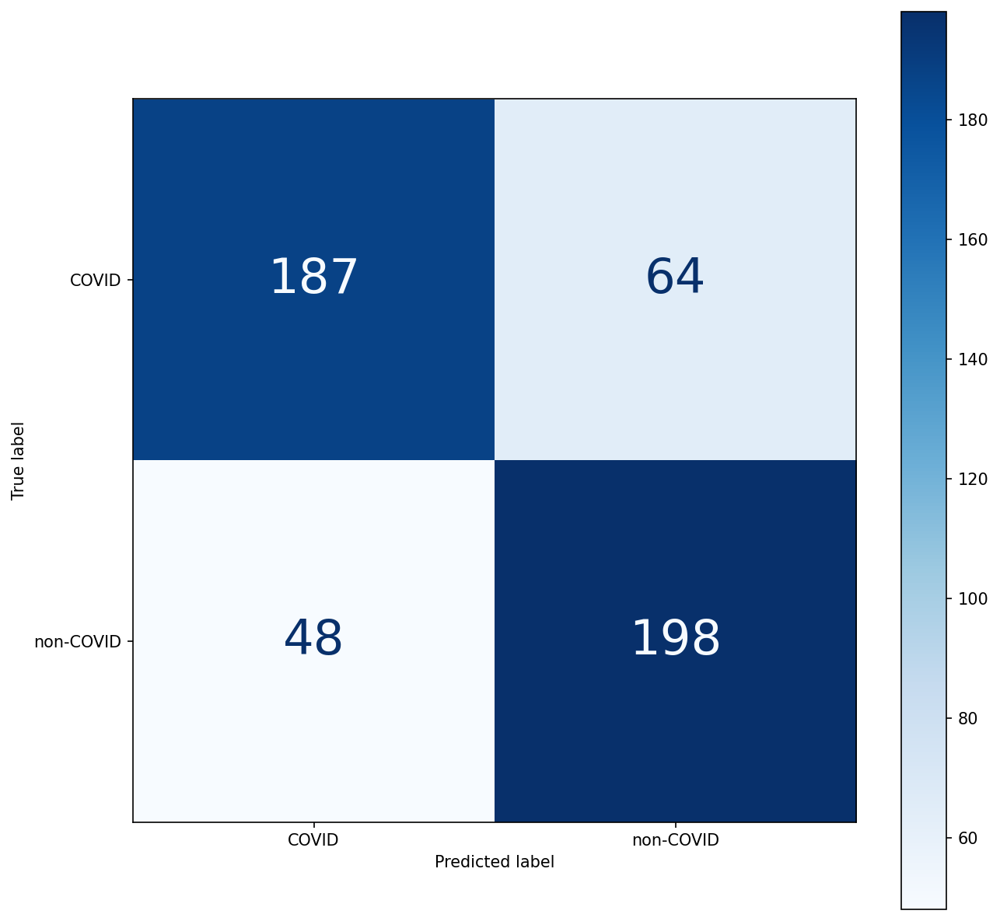

In [49]:
cm = confusion_matrix(testY, np.argmax(predY, axis = -1)) # confusion matrix
cr=(classification_report(testY, np.argmax(predY, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.show()

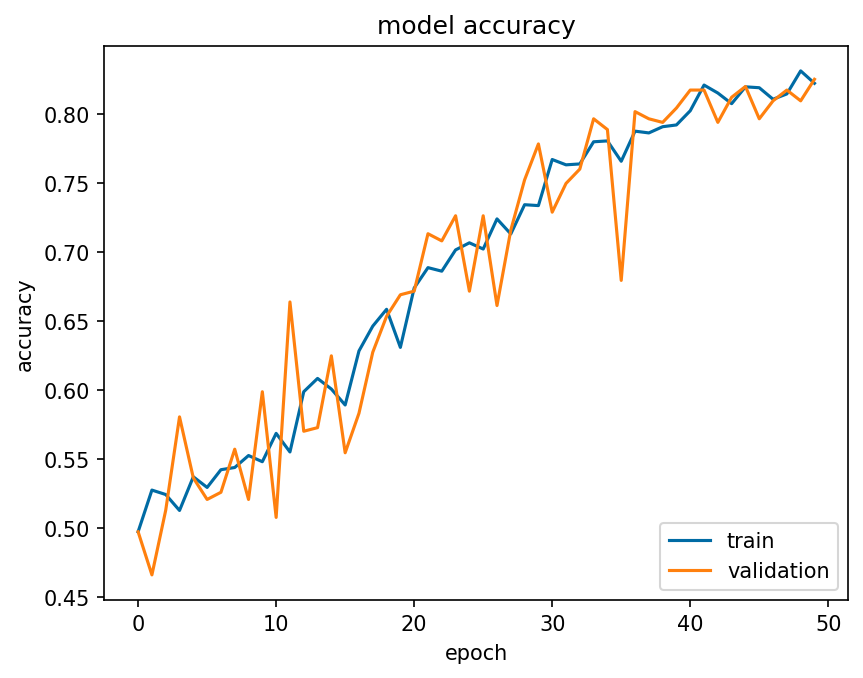

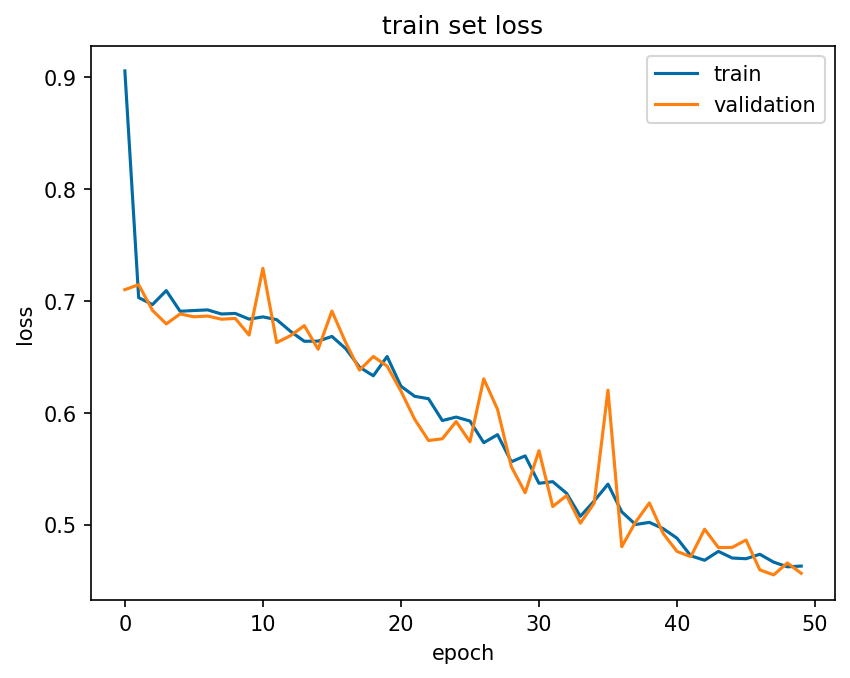

In [50]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('train set loss')

plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [51]:
CCT.save("CCT_model")
np.save('history_CCT.npy',history.history)

**Model 3 -Custom Sequential CNN**

In [19]:
# Define the input layer
input_layer = tf.keras.layers.Input(shape=(224, 224, 1))

# Define the first convolutional layer
conv_layer_1 = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(input_layer)
conv_layer_1 = tf.keras.layers.BatchNormalization()(conv_layer_1)

# Define the second convolutional layer
conv_layer_2 = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(conv_layer_1)
conv_layer_2 = tf.keras.layers.BatchNormalization()(conv_layer_2)

# Define the first max pooling layer
pool_layer_1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_layer_2)

# Define the third convolutional layer
conv_layer_3 = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(pool_layer_1)
conv_layer_3 = tf.keras.layers.BatchNormalization()(conv_layer_3)

# Define the fourth convolutional layer
conv_layer_4 = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(conv_layer_3)
conv_layer_4 = tf.keras.layers.BatchNormalization()(conv_layer_4)

# Define the second max pooling layer
pool_layer_2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_layer_4)

# Define the fifth convolutional layer
conv_layer_5 = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(pool_layer_2)
conv_layer_5 = tf.keras.layers.BatchNormalization()(conv_layer_5)

# Define the sixth convolutional layer
conv_layer_6 = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(conv_layer_5)
conv_layer_6 = tf.keras.layers.BatchNormalization()(conv_layer_6)

# Define the third max pooling layer
pool_layer_3 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_layer_6)

# Define the flatten layer
flatten_layer = tf.keras.layers.Flatten()(pool_layer_3)

# Define the first fully connected layer
fc_layer_1 = tf.keras.layers.Dense(512, activation='relu')(flatten_layer)
fc_layer_1 = tf.keras.layers.BatchNormalization()(fc_layer_1)

#Define the second fully connected layer
fc_layer_2 = tf.keras.layers.Dense(256, activation='relu')(fc_layer_1)
fc_layer_2 = tf.keras.layers.BatchNormalization()(fc_layer_2)

#Define the output layer
output_layer = tf.keras.layers.Dense(2, activation='softmax')(fc_layer_2)

#Create the model
CNN_seq = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

In [20]:
optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)

    
CNN_seq.compile(optimizer = optimizer, 
              loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing = 0.1), 
              metrics = [tf.keras.metrics.CategoricalAccuracy(name="accuracy"),
                         tf.keras.metrics.TopKCategoricalAccuracy(5, name="top-5-accuracy"),
                        ],
             )


STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

earlystopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                                 min_delta = 0,
                                                 patience = 15,
                                                 mode = 'auto',
                                                 verbose = 1)

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath = './CNN_seq.hdf5',
                                                  monitor = 'val_accuracy', 
                                                  verbose = 1, 
                                                  save_best_only = True,
                                                  save_weights_only = True,
                                                  mode = 'max')

decay_steps = train_gen.n // train_gen.batch_size
initial_learning_rate = learning_rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate, decay_steps)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lr_decayed_fn)

callbacks = [earlystopping, lr_scheduler, checkpointer]

startTrain_seq = time()
history = CNN_seq.fit(x = train_gen,
          steps_per_epoch = STEP_SIZE_TRAIN,
          validation_data = valid_gen,
          validation_steps = STEP_SIZE_VALID,
          epochs = num_epochs,
          callbacks = callbacks)
time_passed_CCN_seq = time()-startTrain_seq

Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.7971 - accuracy: 0.6632 - top-5-accuracy: 1.0000
Epoch 1: val_accuracy improved from -inf to 0.53125, saving model to ./CNN_seq.hdf5
49/49 [==============================] - 33s 412ms/step - loss: 0.7971 - accuracy: 0.6632 - top-5-accuracy: 1.0000 - val_loss: 1.3644 - val_accuracy: 0.5312 - val_top-5-accuracy: 1.0000 - lr: 0.0010
Epoch 2/50
49/49 [==============================] - ETA: 0s - loss: 0.5740 - accuracy: 0.7185 - top-5-accuracy: 1.0000
Epoch 2: val_accuracy did not improve from 0.53125
49/49 [==============================] - 19s 383ms/step - loss: 0.5740 - accuracy: 0.7185 - top-5-accuracy: 1.0000 - val_loss: 2.2841 - val_accuracy: 0.5286 - val_top-5-accuracy: 1.0000 - lr: 9.9897e-04
Epoch 3/50
49/49 [==============================] - ETA: 0s - loss: 0.5437 - accuracy: 0.7641 - top-5-accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.53125 to 0.53385, saving model to ./CNN_seq.hdf5
49/49 [============

In [54]:
print("Trainable parameters: ",model.count_params() )

print("Running time: ",t.strftime("%Hh%Mm%Ss", t.gmtime(time_passed_CCN_seq)))

Trainable parameters:  305474
Running time:  00h21m59s


In [21]:
test_gen.reset()
predY=CNN_seq.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)
testY = test_gen.classes

497/497 [==============================] - 4s 7ms/step


**Confusion Matrix**

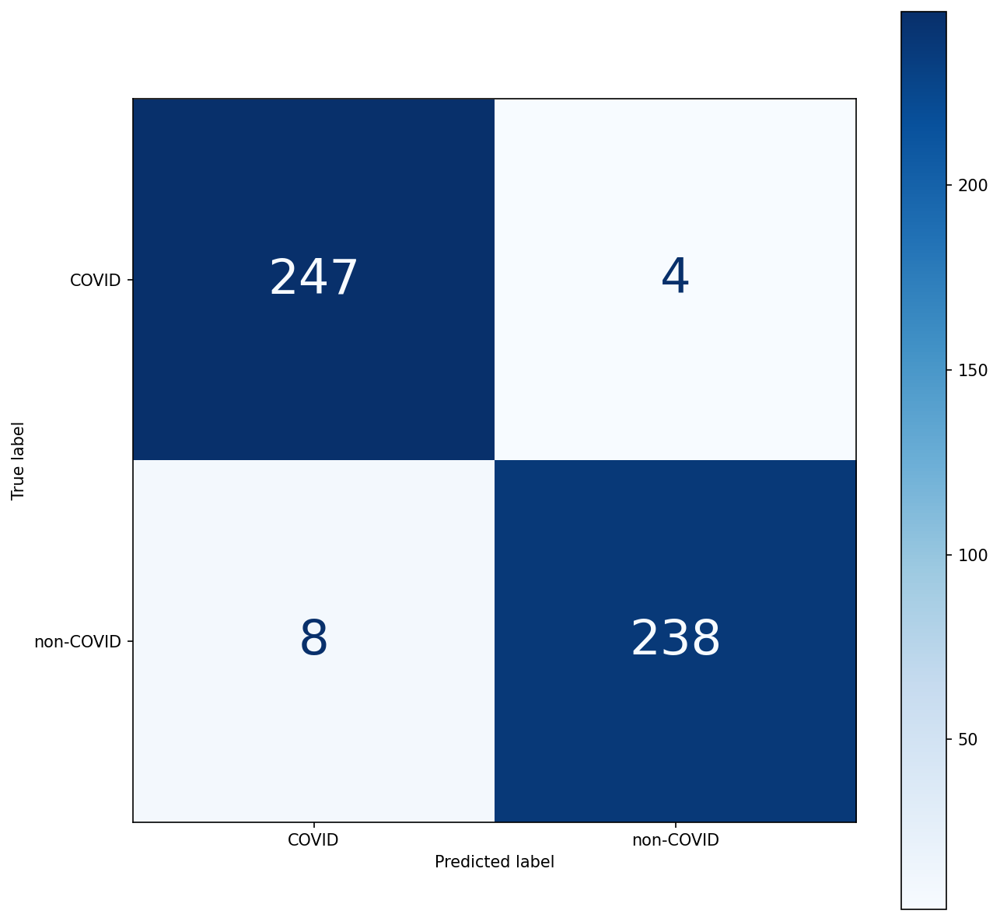

In [22]:
cm = confusion_matrix(testY, np.argmax(predY, axis = -1)) # confusion matrix
cr=(classification_report(testY, np.argmax(predY, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.show()

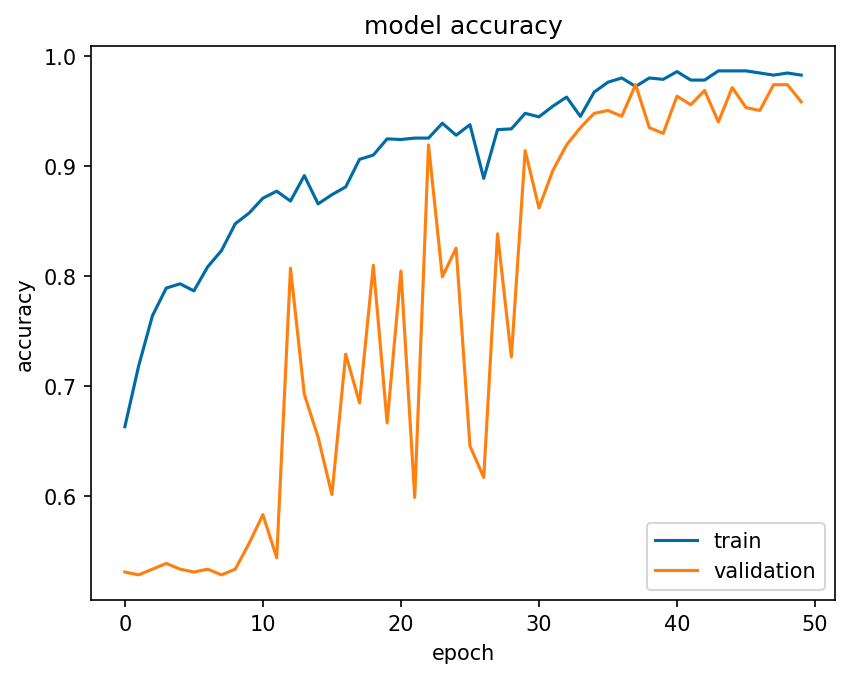

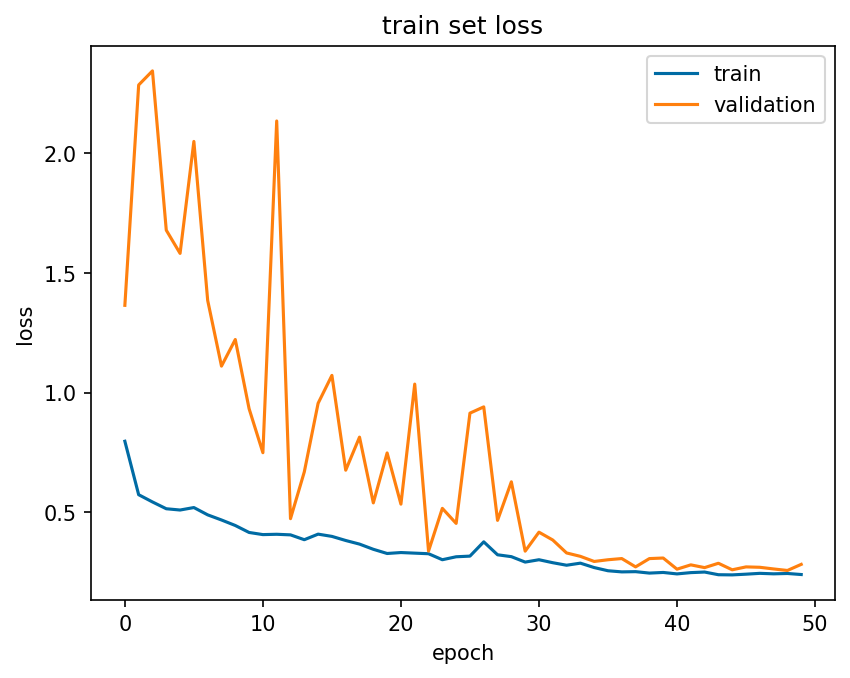

In [23]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('train set loss')

plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [24]:
CNN_seq.save("CNN_seq")
np.save('history_CNN_seq.npy',history.history)

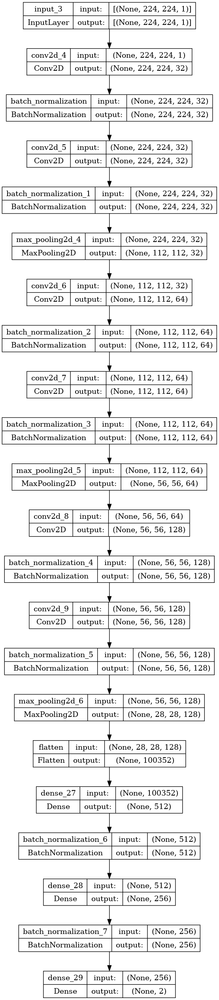

In [59]:
tf.keras.utils.plot_model(CNN_seq, to_file='./CNN_seq.png', show_shapes=True, show_layer_names=True)

**Ensemble Modeling**

In [25]:
# ViT = tf.keras.models.load_model('/kaggle/working/ViT_model')
# CCT = tf.keras.models.load_model('/kaggle/working/CCT_model')
CNN_Sequential = tf.keras.models.load_model('/kaggle/working/CNN_seq')

In [61]:
from sklearn.ensemble import VotingClassifier

In [62]:
# Ensemble of Models 
estimator = [] 
estimator.append(('ViT',ViT))
estimator.append(('CTT', CCT)) 
estimator.append(('CNN_Sequential', CNN_Sequential))

In [63]:
print(estimator)

[('ViT', <keras.saving.legacy.saved_model.load.VisionTransformer object at 0x79ffd635a9e0>), ('CTT', <keras.engine.functional.Functional object at 0x79ffea083a60>), ('CNN_Sequential', <keras.engine.functional.Functional object at 0x79ffd43f9990>)]


In [64]:
STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

In [65]:
test_gen.reset()
pred_ViT=ViT.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)
testY = test_gen.classes

497/497 [==============================] - 9s 16ms/step


In [66]:
test_gen.reset()
pred_CCT=CCT.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)

497/497 [==============================] - 8s 12ms/step


In [67]:
test_gen.reset()
pred_CNN_Sequential=CNN_Sequential.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)

497/497 [==============================] - 3s 7ms/step


In [68]:
stack=np.dstack((pred_ViT,pred_CCT,pred_CNN_Sequential))
avg_ensemble_prob=np.mean(stack,axis=-1)
avg_ensemble_pred=np.argmax(avg_ensemble_prob,axis=-1)

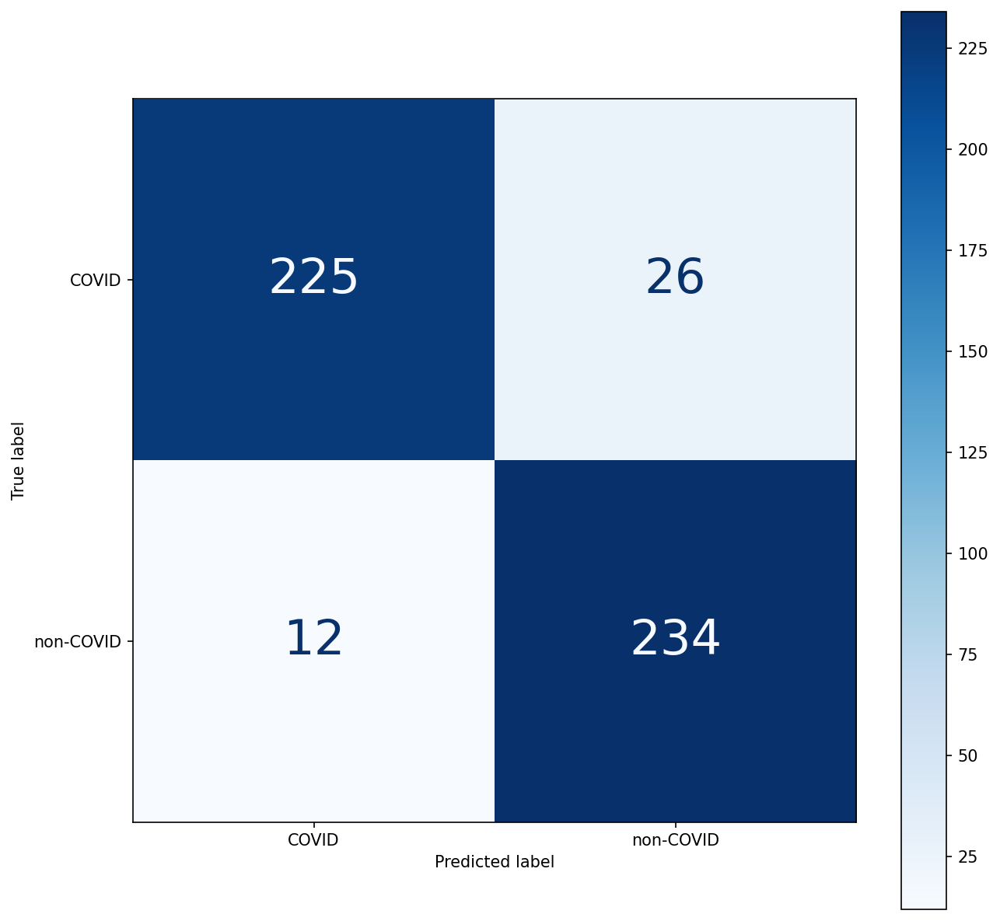

In [69]:
cm = confusion_matrix(testY, avg_ensemble_pred) # confusion matrix
cr=(classification_report(testY, avg_ensemble_pred, target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.savefig('ensemble_conf.png', dpi=1200)
plt.show()

<Axes: >

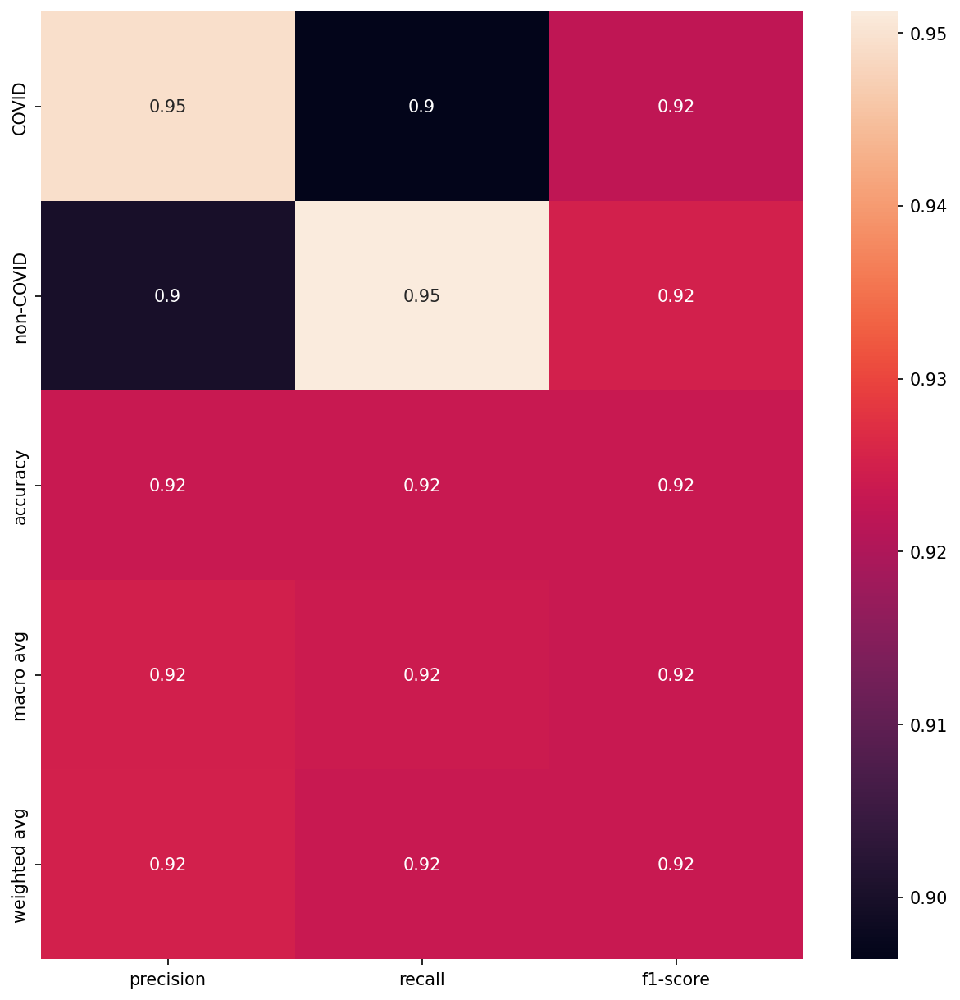

In [70]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.heatmap(pd.DataFrame(cr).iloc[:-1, :].T, annot=True, ax=ax)

In [71]:
cr1=(classification_report(testY, avg_ensemble_pred, target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr2=(classification_report(testY, np.argmax(pred_ViT, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr3=(classification_report(testY, np.argmax(pred_CCT, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr4=(classification_report(testY, np.argmax(pred_CNN_Sequential, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

print("ViT Accuracy:" + str(cr2['accuracy']))
print("CCT Accuracy:" + str(cr3['accuracy']))
print("CNN_Sequential Accuracy:" + str(cr4['accuracy']))


ViT Accuracy:0.8450704225352113
CCT Accuracy:0.7746478873239436
CNN_Sequential Accuracy:0.9577464788732394


**Grad-Cam**

In [26]:
y_val = test_gen.classes
y_pred = CNN_Sequential.predict(test_gen)
confidence = np.max(y_pred,axis=1)
y_pred = np.argmax(y_pred,axis=1)
print(classification_report(y_val,y_pred))

497/497 [==============================] - 4s 8ms/step
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       251
           1       0.98      0.97      0.98       246

    accuracy                           0.98       497
   macro avg       0.98      0.98      0.98       497
weighted avg       0.98      0.98      0.98       497



In [28]:
class_indices = test_gen.class_indices
indices = {v:k for k,v in class_indices.items()}

In [29]:
filenames = test_gen.filenames

In [30]:
result_df = pd.DataFrame()
result_df['filename'] = filenames
result_df['actual'] = y_val
result_df['predicted'] = y_pred
result_df['actual'] = result_df['actual'].apply(lambda x: indices[x])
result_df['predicted'] = result_df['predicted'].apply(lambda x: indices[x])
result_df.loc[result_df['actual']==result_df['predicted'],'Same'] = True
result_df.loc[result_df['actual']!=result_df['predicted'],'Same'] = False
result_df['confidence'] = confidence
result_df.head(10)

,filename,actual,predicted,Same,confidence
0,COVID/Covid (100).png,COVID,COVID,True,0.994594
1,COVID/Covid (1010).png,COVID,COVID,True,0.989259
2,COVID/Covid (1013).png,COVID,COVID,True,0.982467
3,COVID/Covid (1024).png,COVID,COVID,True,0.941686
4,COVID/Covid (1035).png,COVID,COVID,True,0.922951
5,COVID/Covid (1042).png,COVID,COVID,True,0.885858
6,COVID/Covid (1043).png,COVID,COVID,True,0.917226
7,COVID/Covid (1052).png,COVID,COVID,True,0.970550
8,COVID/Covid (1055).png,COVID,COVID,True,0.972681
9,COVID/Covid (1059).png,COVID,COVID,True,0.971156


In [31]:
result_df = result_df.sample(frac=1).reset_index(drop=True)

In [32]:
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img
def readImage(path):
    img = load_img(path,color_mode='grayscale',target_size=(image_size,image_size))
    img = img_to_array(img)
    img = img/255.
    
    return img

def display_images(temp_df):
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(15):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        image = readImage("/kaggle/input/sarscov2-ctscan-dataset/"+str(temp_df.filename[i]))
        plt.imshow(image)
        plt.title("Actual Class:" + str(temp_df.actual[i]) + "\n" + "Predicted Class:" + str(temp_df.predicted[i]) + "\n" + "Confidence:" + str(temp_df.confidence[i]))

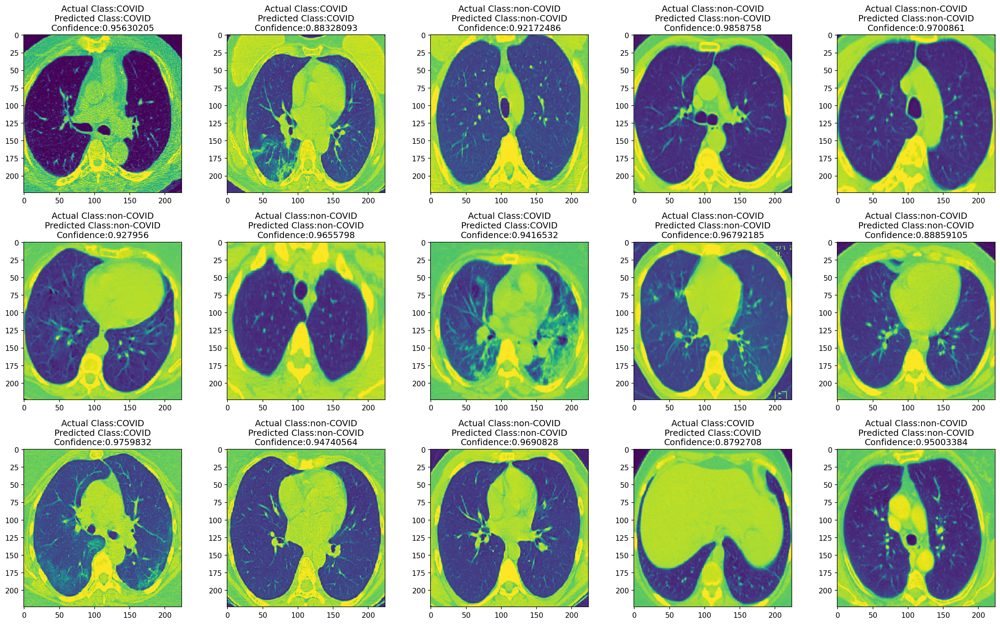

In [78]:
display_images(result_df[result_df['Same']==True])
plt.tight_layout()
plt.savefig('confidence', dpi=1200)

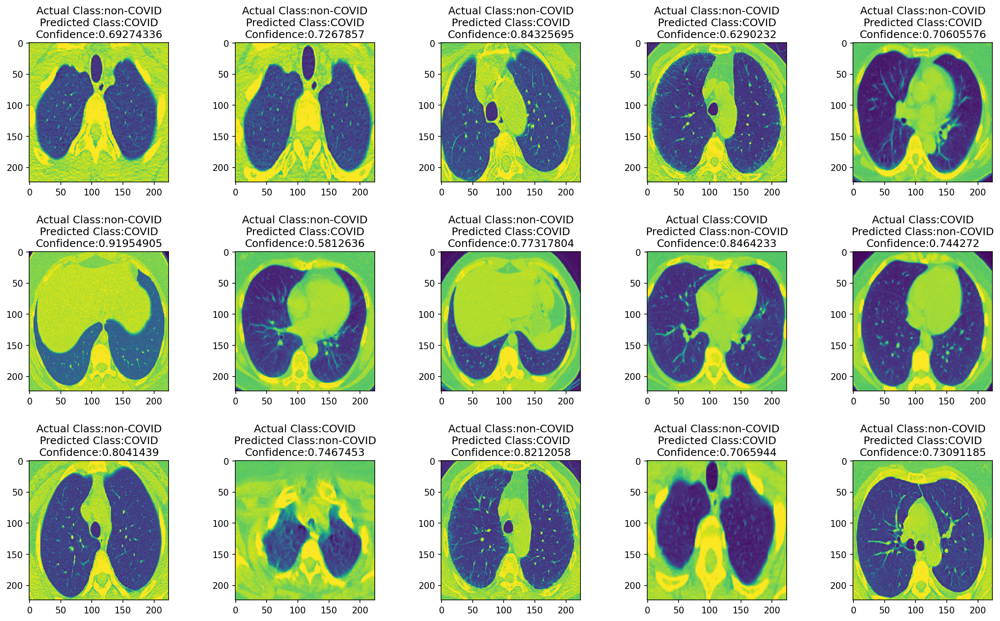

In [79]:
display_images(result_df[result_df['Same']!=True])

In [33]:
import matplotlib.cm as cm
from tensorflow.keras.models import Model
result_df

,filename,actual,predicted,Same,confidence
0,non-COVID/Non-Covid (512).png,non-COVID,non-COVID,True,0.932680
1,non-COVID/Non-Covid (446).png,non-COVID,non-COVID,True,0.947258
2,COVID/Covid (642).png,COVID,COVID,True,0.900741
3,COVID/Covid (1186).png,COVID,COVID,True,0.930736
4,non-COVID/Non-Covid (397).png,non-COVID,non-COVID,True,0.501577
...,...,...,...,...,...
492,COVID/Covid (61).png,COVID,COVID,True,0.977190
493,non-COVID/Non-Covid (192).png,non-COVID,non-COVID,True,0.983355
494,non-COVID/Non-Covid (614).png,non-COVID,non-COVID,True,0.962372
495,COVID/Covid (986).png,COVID,COVID,True,0.986318


In [34]:
result_df.to_csv('prediction_results.csv', index=False)

In [35]:
import torch
from torch.utils.data import DataLoader as torch_dataloader
from torch.utils.data import Dataset as torch_dataset
from torchvision.utils import make_grid
from torchvision import transforms
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as tt
from torchvision.datasets.utils import download_url
from torch.utils.data import random_split
from torchvision.utils import make_grid
from torchvision.transforms import ToTensor

In [36]:
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt
import skimage
import skimage.io as io
import glob
import pandas as pd
import torch.optim as optim

In [37]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_acc']))

class Resnet18(ImageClassificationBase):
    def __init__(self):
        super().__init__()
        # Use a pretrained model
        self.network = models.resnet18(pretrained=True)
        # Replace last layer
        num_ftrs = self.network.fc.in_features
        self.network.fc = nn.Linear(num_ftrs, 2)

        for param in self.network.parameters():
            param.require_grad = False
        for param in self.network.fc.parameters():
            param.require_grad = True

    def forward(self, xb):
      return self.network(xb)

#     def freeze(self):
#         # To freeze the residual layers
#         for param in self.network.parameters():
#             param.require_grad = False
#         for param in self.network.fc.parameters():
#             param.require_grad = True

#     def unfreeze(self):
#         # Unfreeze all layers
#         for param in self.network.parameters():
#             param.require_grad = True
model_res = Resnet18()

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 51.4MB/s]


In [38]:
model_res

Resnet18(
  (network): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_ru

In [39]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 30.3 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38247 sha256=8878d8231455baedee9c76dba147fe0ed68f357354fbf2919eca6efffc03e7f4
  Stored in directory: /root/.cache/pip/wheels/f8/04/36/94ff3c8a4215826a21946b34c01180817e606989fdf53f7cd6
Successfully built grad-cam


In [40]:
from pytorch_grad_cam import GradCAM,EigenCAM
#from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from PIL import Image

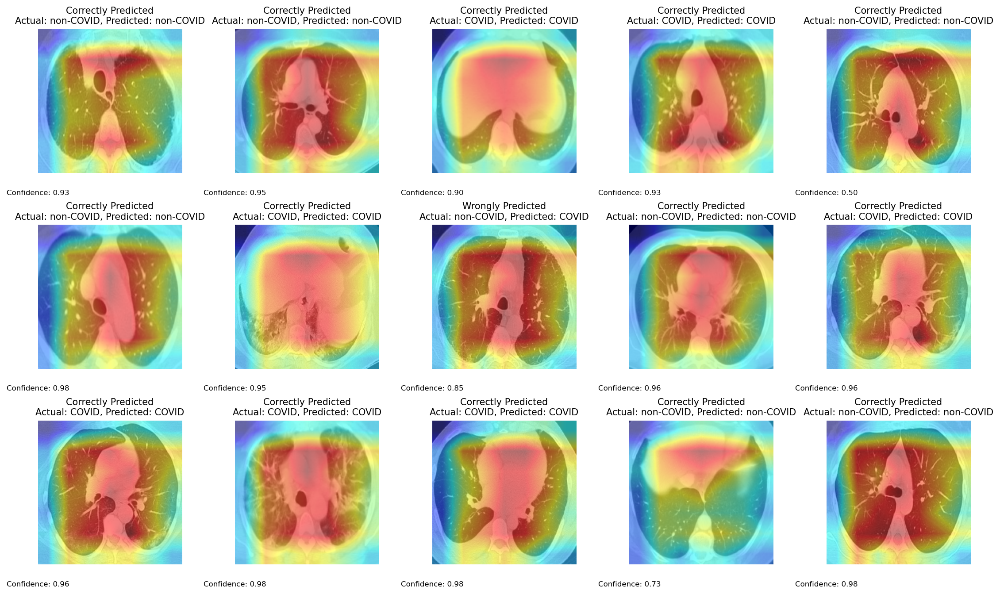

In [44]:
import os
import matplotlib.pyplot as plt
from skimage import io, color
from skimage.transform import resize
import torch
from pytorch_grad_cam import GradCAM, EigenCAM
from torchvision.models import resnet18

# Specify the folder path containing the images
folder_path = "/kaggle/working/out/test"

# Get a list of image filenames in the folder
image_files = os.listdir(folder_path)

# Load the model
model = resnet18(pretrained=False)  # Load your custom model

# Specify the target layer(s)
target_layers = [model.layer4[-1]]  # Specify the target layer(s) for GradCAM

# Create the GradCAM object
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=False)

# Load the prediction results DataFrame
result_df = pd.read_csv('/kaggle/working/prediction_results.csv')  # Replace with the path to your prediction results file

# Filter the DataFrame to get only the first 15 rows
result_df = result_df.head(15)

# Create a subplot grid for displaying the images
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 9))

# Process each row in the DataFrame and display the images in subplots
for index, row in result_df.iterrows():
    # Get the actual label, predicted label, and confidence
    actual_label = row['actual']
    predicted_label = row['predicted']
    is_same = row['Same']
    confidence = row['confidence']

    # Load and preprocess the image
    image_file = row['filename']
    image_path = os.path.join(folder_path, image_file)
    image = io.imread(image_path)
    image_resized = resize(image, (224, 224))

    # Check if the image has an alpha channel (RGBA)
    if image_resized.shape[-1] == 4:
        image_resized = image_resized[:, :, :3]  # Remove alpha channel

    image_gray = color.rgb2gray(image_resized)
    image_input = np.stack((image_gray,) * 3, axis=-1)
    image_input = image_input.astype("float32")
    image_input = image_input / image_input.max()

    # Convert image_input to a tensor
    image_input_tensor = torch.from_numpy(image_input).permute(2, 0, 1).unsqueeze(0)

    # Set the device to 'cpu'
    device = torch.device('cpu')
    image_input_tensor = image_input_tensor.to(device=device)

    # Get the GradCAM output for the current image
    grayscale_cam = cam(input_tensor=image_input_tensor)

    # Check if the grayscale_cam is a valid array or tensor
    if isinstance(grayscale_cam, (torch.Tensor, np.ndarray)):
        if isinstance(grayscale_cam, torch.Tensor):
            grayscale_cam = grayscale_cam.squeeze().cpu().numpy()  # Convert to numpy array
        else:
            grayscale_cam = grayscale_cam.squeeze()

        # Normalize the image
        normalized_image = image_input / image_input.max()

        # Show cam on image
        cam_image = show_cam_on_image(normalized_image, grayscale_cam, use_rgb=True)

        # Determine the subplot coordinates
        row_index = index // 5
        col_index = index % 5

        # Display the image in the corresponding subplot
        ax = axes[row_index, col_index]
        ax.imshow(cam_image)
        ax.axis('off')

        if is_same:
            ax.set_title("Correctly Predicted\nActual: {}, Predicted: {}".format(actual_label, predicted_label),
                         fontsize=10)
            ax.text(0, -0.15, "Confidence: {:.2f}".format(confidence), transform=ax.transAxes, fontsize=8,
                    ha='center')
        else:
            ax.set_title("Wrongly Predicted\nActual: {}, Predicted: {}".format(actual_label, predicted_label),
                         fontsize=10)
            ax.text(0, -0.15, "Confidence: {:.2f}".format(confidence), transform=ax.transAxes, fontsize=8,
                    ha='center')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


In [104]:
history_ViT=np.load('/kaggle/working/history_ViT.npy',allow_pickle='TRUE').item()
history_CCT=np.load('/kaggle/working/history_CCT.npy',allow_pickle='TRUE').item()
history_Seq=np.load('/kaggle/working/history_CNN_seq.npy',allow_pickle='TRUE').item()


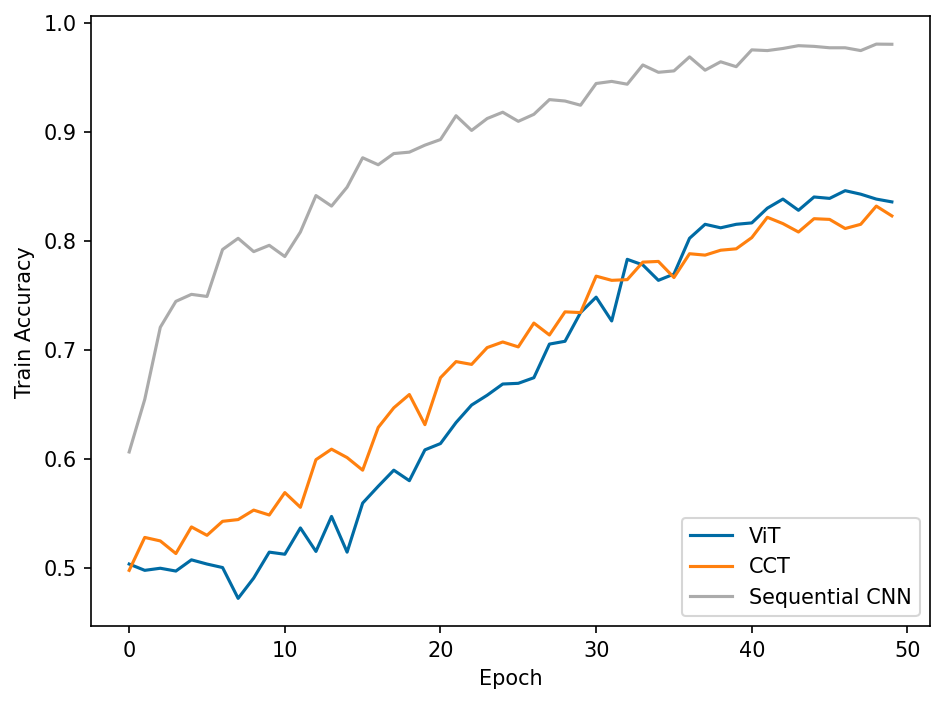

In [105]:
plt.plot(history_ViT['accuracy'])
plt.plot(history_CCT['accuracy'])
plt.plot(history_Seq['accuracy'])
#plt.title('Train Accuracy')
plt.ylabel('Train Accuracy')
plt.xlabel('Epoch')
plt.legend(['ViT', 'CCT','Sequential CNN', 'Attention-based CNN'], loc='lower right')
plt.tight_layout()
plt.savefig('train_accuracy.png', dpi=1200)
plt.show()

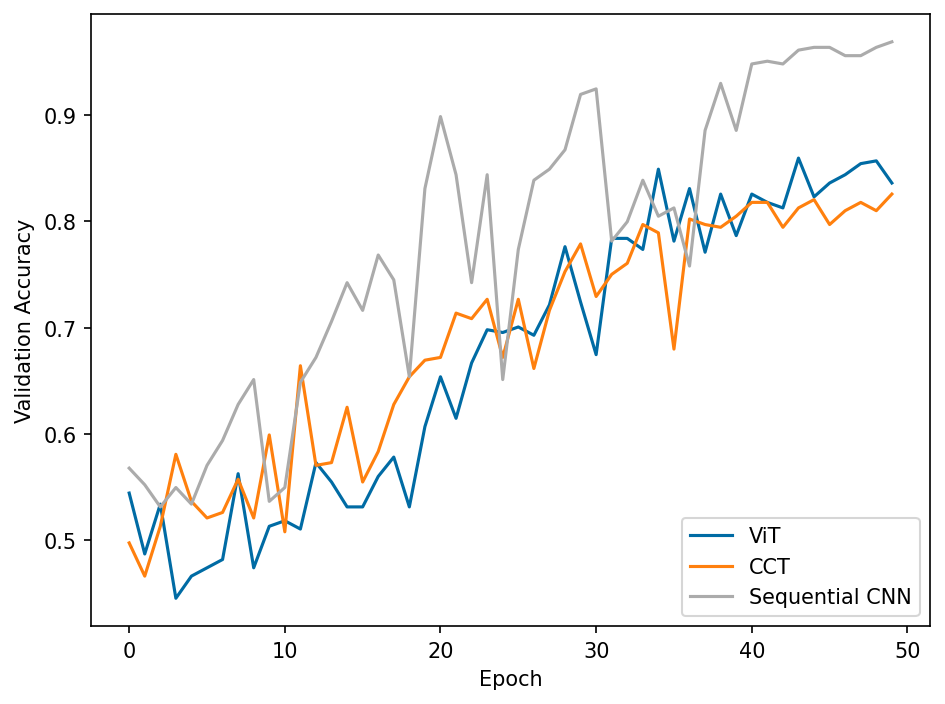

In [106]:
plt.plot(history_ViT['val_accuracy'])
plt.plot(history_CCT['val_accuracy'])
plt.plot(history_Seq['val_accuracy'])

plt.ylabel('Validation Accuracy')
plt.xlabel('Epoch')
plt.legend(['ViT', 'CCT','Sequential CNN', 'Attention-based CNN'], loc='lower right')
plt.tight_layout()
plt.savefig('validation_accuracy.png', dpi=1200)
plt.show()

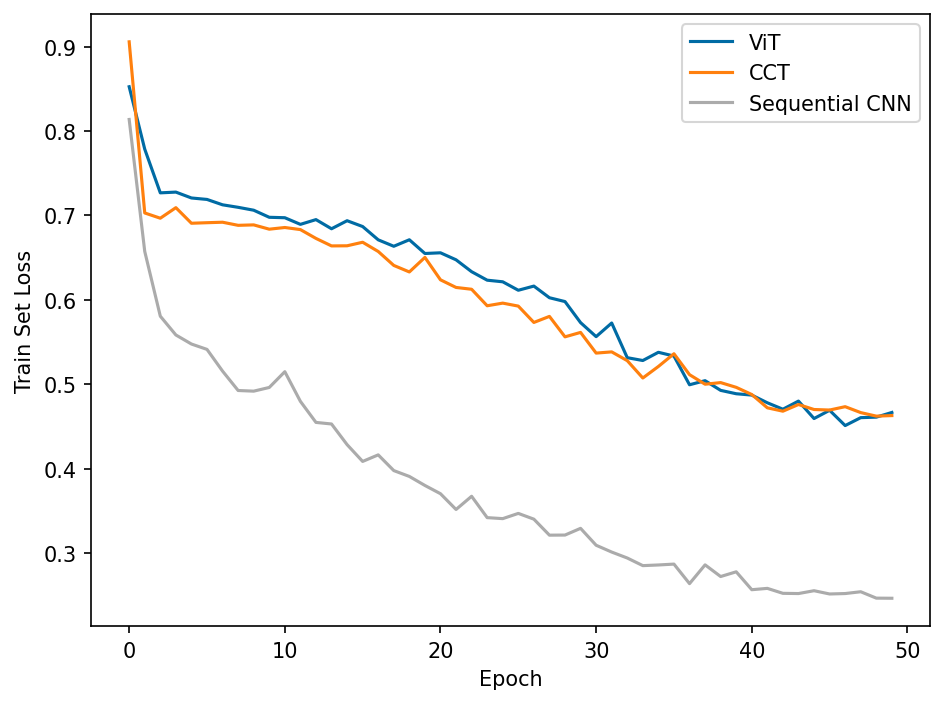

In [107]:
plt.plot(history_ViT['loss'])
plt.plot(history_CCT['loss'])
plt.plot(history_Seq['loss'])

plt.ylabel('Train Set Loss')
plt.xlabel('Epoch')
plt.legend(['ViT', 'CCT','Sequential CNN', 'Attention-based CNN'], loc='upper right')
plt.tight_layout()
plt.savefig('train_loss.png', dpi=1200)
plt.show()

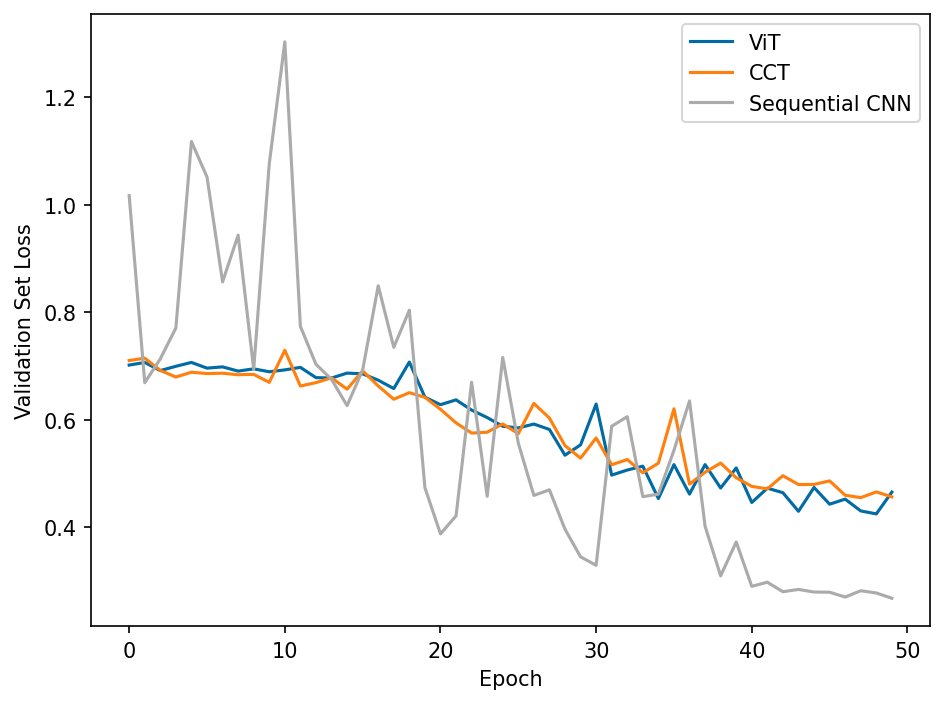

In [108]:
plt.plot(history_ViT['val_loss'])
plt.plot(history_CCT['val_loss'])
plt.plot(history_Seq['val_loss'])

plt.ylabel('Validation Set Loss')
plt.xlabel('Epoch')
plt.legend(['ViT', 'CCT','Sequential CNN', 'Attention-based CNN'], loc='upper right')
plt.tight_layout()
plt.savefig('val_loss.png', dpi=1200)
plt.show()